# Trabajo Práctico 1 - Udesa Panorámica
## Manuela Gómez Pazos y Martina Grünewald
---

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from i308_utils import imshow, show_images
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import random

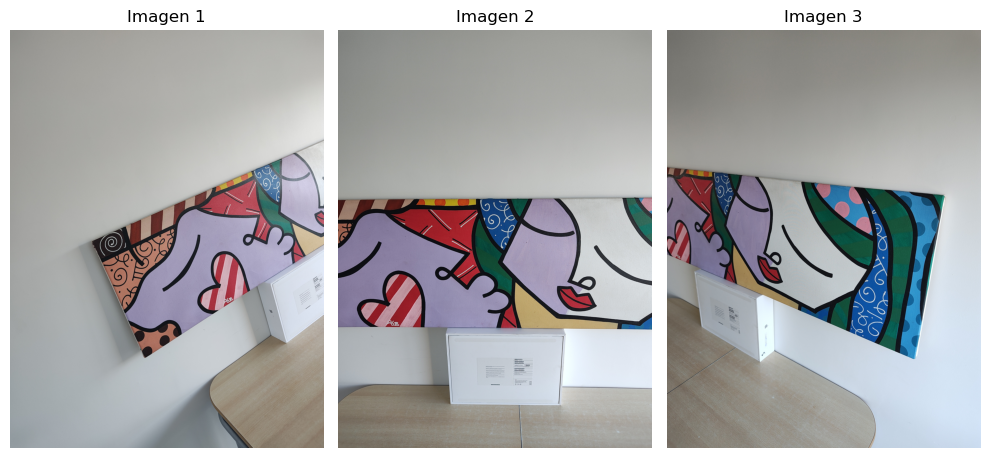

In [3]:
img0 = cv2.imread("img/cuadro_0.jpg")
img1 = cv2.imread("img/cuadro_1.jpg")
img2 = cv2.imread("img/cuadro_2.jpg")

fig, axs = plt.subplots(1, 3, figsize=(10, 5))

axs[0].imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
axs[0].set_title('Imagen 1')
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axs[1].set_title('Imagen 2')
axs[1].axis('off')
axs[2].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
axs[2].set_title('Imagen 3')
axs[2].axis('off')

plt.tight_layout()
plt.show()

## 3.1) Detección y descripción de los features

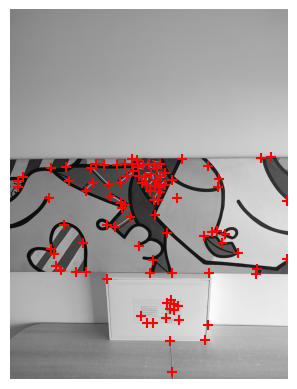

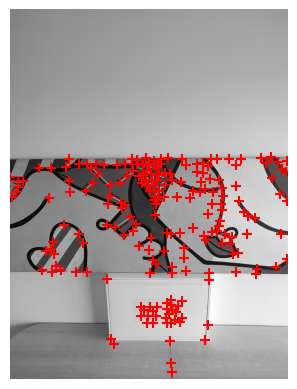

In [4]:
def find_corners(img, method='harris'):
  if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  useHarrisDetector = method=='harris'
  img = np.float32(img)
  corners = cv2.goodFeaturesToTrack(
      img,
      maxCorners=200, #disminuimos la cantidad máxima porque shi-tomasi se pasaba
      qualityLevel=0.05,
      minDistance=50, #aumentamos la distancia para que no se solapen y sea más distintivo
      useHarrisDetector=useHarrisDetector
  )

  corners = corners.reshape(-1, 2)
  return corners


def plot_corners(img, **kwargs):

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  corners = find_corners(gray, **kwargs)

  plt.imshow(gray, cmap='gray')
  plt.axis('off')
  plt.scatter(corners[:, 0], corners[:, 1], s=50, marker='+', color='red')
  plt.show()

plot_corners(img1, method='harris')
plot_corners(img1, method='shi-tomasi')

Podemos ver como el método de Shi-Tomasi detecta muchos más corners que el método de Harris.

---

## 3.2) Supresión de No Máxima Adaptativa (ANMS)

In [5]:
def anms(keypoints, N):
    R = [float('inf')] * len(keypoints)

    for i in range(len(keypoints)):
        xi, yi, ri = keypoints[i]
        for j in range(len(keypoints)):
            if i == j:
                continue
            xj, yj, rj = keypoints[j]
            if rj > ri:
                sd = (xj - xi)**2 + (yj - yi)**2
                if sd < R[i]:
                    R[i] = sd

    keypoints_with_R = [(kp, R_val) for kp, R_val in zip(keypoints, R)]
    keypoints_sorted = sorted(keypoints_with_R, key=lambda x: -x[1])
    selected_keypoints = [kp for kp, _ in keypoints_sorted[:N]]
    return selected_keypoints


def run_anms(img, method='harris', N=50):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray32 = np.float32(gray)

    harris_response = cv2.cornerHarris(gray32, blockSize=2, ksize=3, k=0.04)
    raw_corners = find_corners(img, method=method)

    keypoints_with_r = []
    for x, y in raw_corners:
        x_int, y_int = int(round(x)), int(round(y))
        if 0 <= x_int < harris_response.shape[1] and 0 <= y_int < harris_response.shape[0]:
            r = harris_response[y_int, x_int] 
            keypoints_with_r.append((x, y, r))
    selected = anms(keypoints_with_r, N)

    return selected


def plot_keypoints(img, keypoints):
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    for x, y, _ in keypoints:
        plt.plot(x, y, 'r+', markersize=10)
    plt.title('Keypoints seleccionados por ANMS')
    plt.axis('off')
    plt.show()

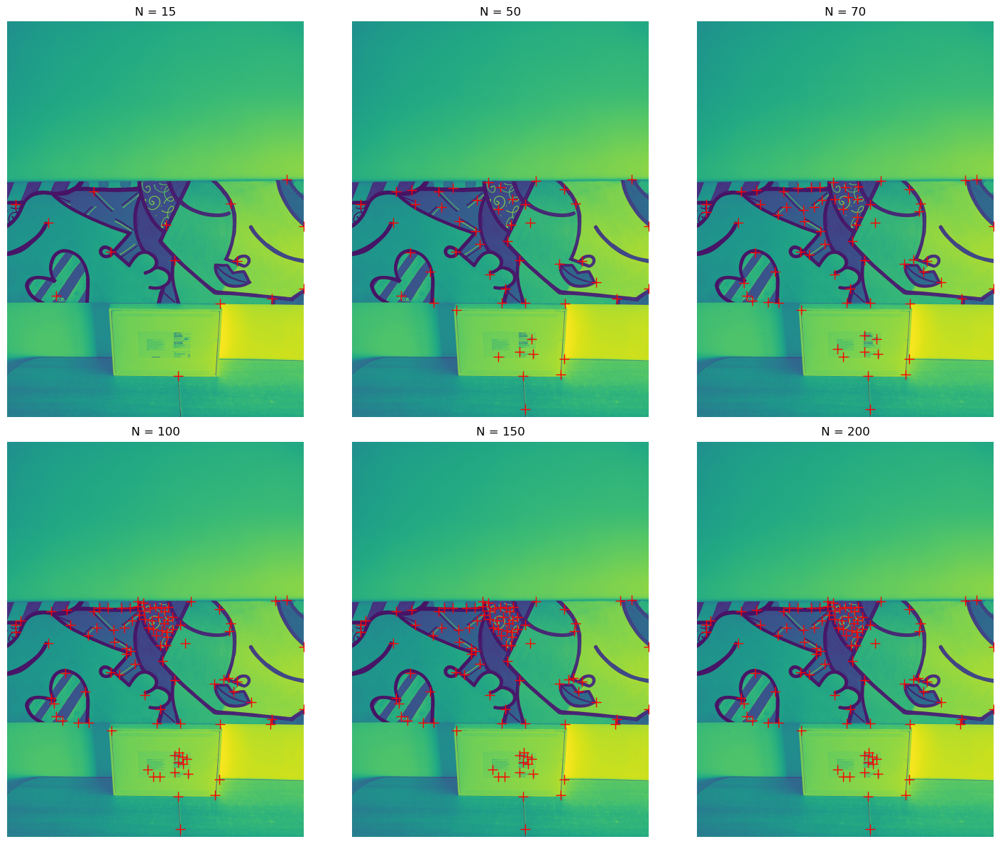

In [6]:
ns = [15, 50, 70, 100, 150, 200]

fig, axs = plt.subplots(2, 3, figsize=(15, 12))  
axs = axs.flatten() 

for i, n in enumerate(ns):
    selected = run_anms(img1, method='harris', N=n)

    axs[i].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))
    axs[i].set_title(f'N = {n}')
    axs[i].axis('off')

    for x, y, _ in selected:
        axs[i].plot(x, y, 'r+', markersize=10)

plt.tight_layout()
plt.show()


A ojo, vemos que con N=70 tenemos los keypoints separados uniformemente

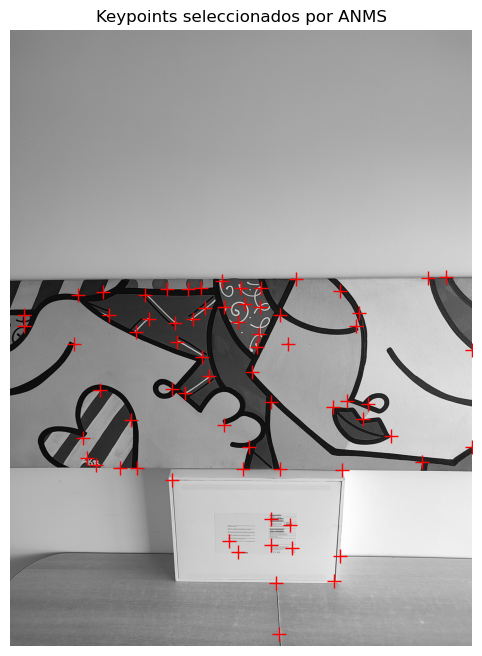

In [7]:
selected = run_anms(img1, method='harris', N=70)
plot_keypoints((cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)), selected)

---
## 3.3) Matching

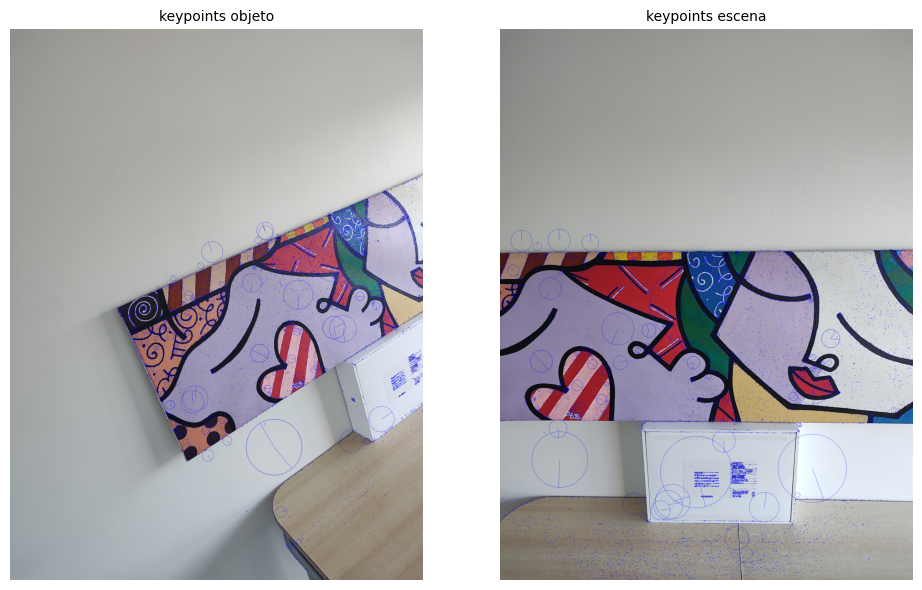

In [8]:
algo = cv2.SIFT_create()
kp_obj, des_obj = algo.detectAndCompute(img0, None)
kp_scn, des_scn = algo.detectAndCompute(img1, None)

kp_obj_image = cv2.drawKeypoints(
    img0,
    kp_obj,
    0, (255, 0, 0),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

kp_scn_image = cv2.drawKeypoints(
    img1,
    kp_scn,
    0, (255, 0, 0),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)


show_images([
    kp_obj_image, kp_scn_image
], ["keypoints objeto", "keypoints escena"])

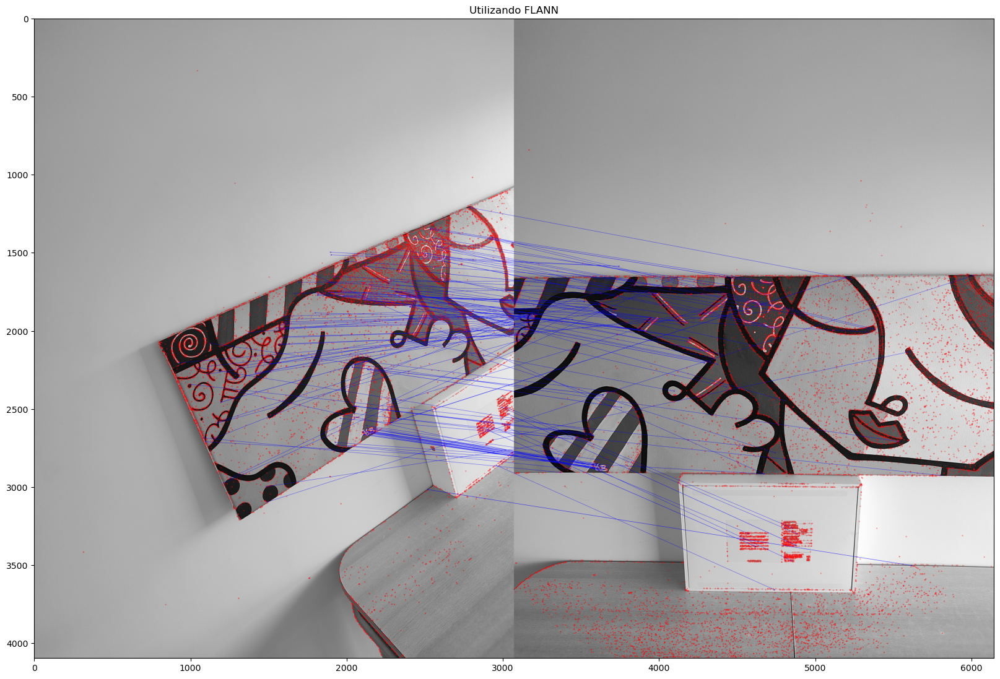

In [9]:
# BFMatcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)  # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des_obj, des_scn, k=2)

# Nos quedamos con matches cuyo segundo mejor match está lejos
matchesMask = [[0, 0] for i in range(len(matches))]
for i, (m, n) in enumerate(matches):
    if m.distance < 0.6 * n.distance:
        matchesMask[i] = [1, 0]

# Dibuja sólo buenos matches
draw_params = dict(matchColor=(0, 0, 255),
                   singlePointColor=(255, 0, 0),
                   matchesMask=matchesMask,
                   flags=cv2.DrawMatchesFlags_DEFAULT)


res_img = cv2.drawMatchesKnn(
    cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY), kp_obj, cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY), kp_scn, matches, None, **draw_params
)

plt.figure(figsize=(20, 16))
plt.title("Utilizando FLANN")
plt.imshow(res_img)
plt.show()

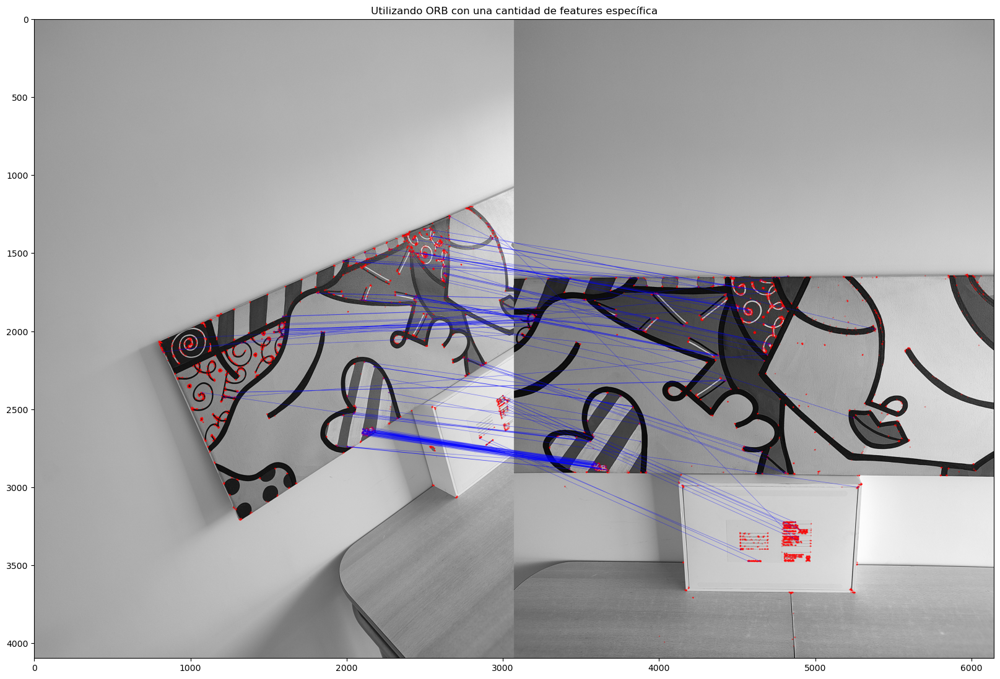

In [10]:
#algo = cv2.ORB_create()
algo = cv2.ORB_create(nfeatures=6000) #le sumamos una cantidad de features porque sino no llega a comparar 2 similares

kp_obj, des_obj = algo.detectAndCompute(img0, None)
kp_scn, des_scn = algo.detectAndCompute(img1, None)

FLANN_INDEX_LSH = 6
index_params = dict(
     algorithm=FLANN_INDEX_LSH,
    table_number=6,  
    key_size=12,     
    multi_probe_level=1)  
search_params = dict(checks=50) 

flann = cv2.FlannBasedMatcher(index_params, search_params)

k = 2
matches = flann.knnMatch(des_obj, des_scn, k)
matchesMask = [[0,0] for i in range(len(matches))]

for i, (m, n) in enumerate(matches):
   if m.distance < 0.7 * n.distance:
      matchesMask[i]=[1,0]
       
draw_params = dict(matchColor = (0,0,255),singlePointColor = (255,0,0),matchesMask = matchesMask,flags = 0)
res_img = cv2.drawMatchesKnn(cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY),kp_obj,cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY),kp_scn,matches,None,**draw_params)

plt.figure(figsize=(20, 16))
plt.title("Utilizando ORB con una cantidad de features específica")
plt.imshow(res_img)
plt.show()

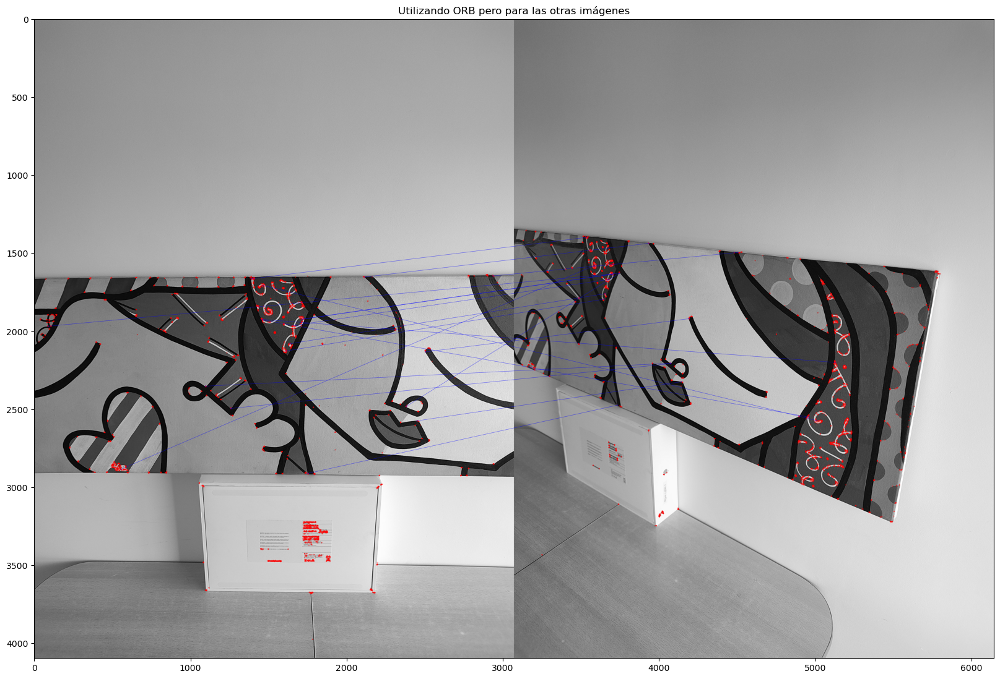

In [11]:
algo = cv2.ORB_create(nfeatures=4000)

kp_obj, des_obj = algo.detectAndCompute(img1, None)
kp_scn, des_scn = algo.detectAndCompute(img2, None)

FLANN_INDEX_LSH = 6
index_params = dict(
     algorithm=FLANN_INDEX_LSH,
    table_number=6, 
    key_size=12,    
    multi_probe_level=1)  
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params, search_params)

k = 2
matches = flann.knnMatch(des_obj, des_scn, k)
matchesMask = [[0,0] for i in range(len(matches))]

for i, (m, n) in enumerate(matches):
   if m.distance < 0.65 * n.distance:
      matchesMask[i]=[1,0]
       
draw_params = dict(matchColor = (0,0,255),singlePointColor = (255,0,0),matchesMask = matchesMask,flags = 0)
res_img = cv2.drawMatchesKnn(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY),kp_obj,cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY),kp_scn,matches,None,**draw_params)

plt.figure(figsize=(20, 16))
plt.title("Utilizando ORB pero para las otras imágenes")
plt.imshow(res_img)
plt.show()

---
## 3.4) Estimación de la homografía (Manalmente)

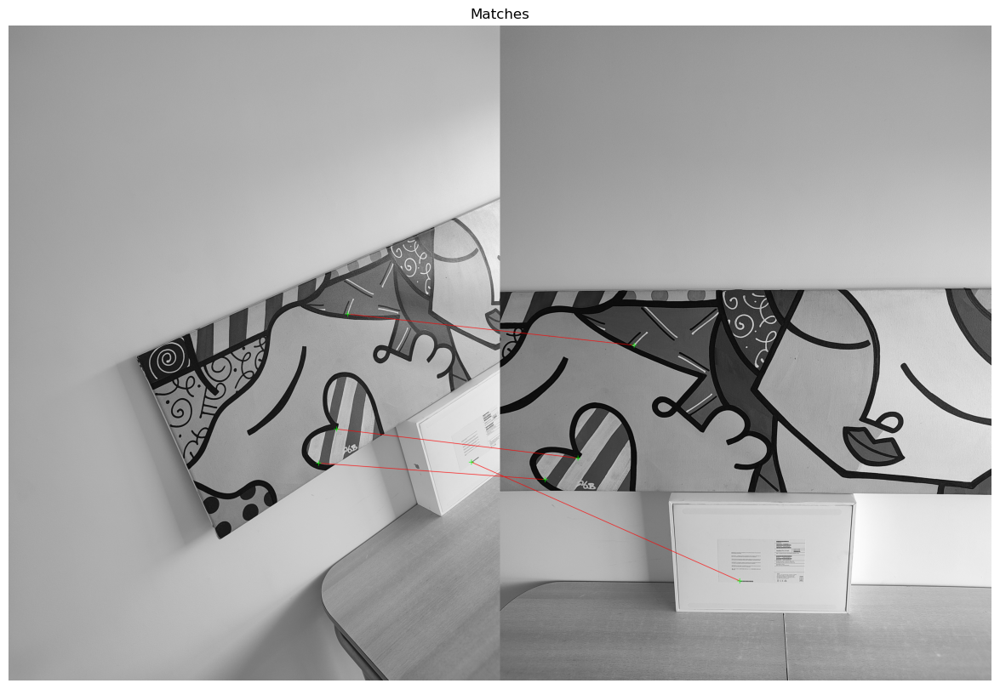

In [ ]:
def distancia(p1, p2):
    return math.hypot(p1[0] - p2[0], p1[1] - p2[1])

def filtrar_por_distancia_minima(puntos1, puntos2, min_dist=200): #para que no tome puntos a pocos píxeles de distancia
    seleccionados = []
    usados = set()

    for i in range(len(puntos1)):
        if i in usados:
            continue
        p1_img0 = puntos1[i]
        p1_img1 = puntos2[i]
        valido = True
        for j in seleccionados:
            if distancia(p1_img0, puntos1[j]) < min_dist or distancia(p1_img1, puntos2[j]) < min_dist:
                valido = False
                break
        if valido:
            seleccionados.append(i)
        if len(seleccionados) == 4:
            break

    return seleccionados

def get_good_matches(matches, ratio_thresh):
    good = []
    for m_n in matches:
        if len(m_n) < 2:
            continue
        m, n = m_n
        if m.distance < ratio_thresh * n.distance:
            good.append(m)
    return good

orb = cv2.ORB_create(nfeatures=1000)

kp_obj, des_obj = orb.detectAndCompute(img0, None)
kp_scn, des_scn = orb.detectAndCompute(img1, None)

FLANN_INDEX_LSH = 6
index_params = dict(algorithm=FLANN_INDEX_LSH,
                    table_number=6,
                    key_size=12,
                    multi_probe_level=1)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des_obj, des_scn, k=2)

good_matches = get_good_matches(matches, 0.75)

if len(good_matches) < 4:
    good_matches = get_good_matches(matches, 0.9)

if len(good_matches) < 4:
    print("No hay suficientes matches válidos")
else:
    top_matches = sorted(good_matches, key=lambda x: x.distance)[:20]

    pts_img0_full = [kp_obj[m.queryIdx].pt for m in top_matches]
    pts_img1_full = [kp_scn[m.trainIdx].pt for m in top_matches]

    indices_filtrados = filtrar_por_distancia_minima(pts_img0_full, pts_img1_full, min_dist=200)

    top_matches = [top_matches[i] for i in indices_filtrados]
    pts_img0 = [pts_img0_full[i] for i in indices_filtrados]
    pts_img1 = [pts_img1_full[i] for i in indices_filtrados]

    gray0 = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

    h1, w1 = gray0.shape
    h2, w2 = gray1.shape
    height = max(h1, h2)
    vis = np.zeros((height, w1 + w2, 3), dtype=np.uint8)
    vis[:h1, :w1, :] = cv2.cvtColor(gray0, cv2.COLOR_GRAY2BGR)
    vis[:h2, w1:w1 + w2, :] = cv2.cvtColor(gray1, cv2.COLOR_GRAY2BGR)

    for i, m in enumerate(top_matches):
        pt1 = tuple(np.round(kp_obj[m.queryIdx].pt).astype(int))
        pt2 = tuple(np.round(kp_scn[m.trainIdx].pt).astype(int))
        pt2_shifted = (pt2[0] + w1, pt2[1])

        cv2.line(vis, pt1, pt2_shifted, (0, 0, 255), 2, cv2.LINE_AA)

        cross_size = 15
        color = (0, 255, 0)
        thickness = 2
        for pt in [pt1, pt2_shifted]:
            cv2.line(vis, (pt[0] - cross_size, pt[1]), (pt[0] + cross_size, pt[1]), color, thickness, cv2.LINE_AA)
            cv2.line(vis, (pt[0], pt[1] - cross_size), (pt[0], pt[1] + cross_size), color, thickness, cv2.LINE_AA)

    plt.figure(figsize=(15, 10))
    plt.title("Matches")
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [13]:
def dlt(ori, dst):
    A = []
    b = []
    for i in range(4):
        x, y = ori[i]
        x_prima, y_prima = dst[i]
        A.append([-x, -y, -1, 0, 0, 0, x * x_prima, y * x_prima])
        A.append([0, 0, 0, -x, -y, -1, x * y_prima, y * y_prima])
        b.append(x_prima)
        b.append(y_prima)

    A = np.array(A)
    b = np.array(b)

    # resolvemos el sistema de ecuaciones A * h = b
    # el sistema es de 8x8, por lo que podemos resolverlo si A es inversible

    # resuelve el sistema de ecuaciones para encontrar los parámetros de H
    H = -np.linalg.solve(A, b)

    # agrega el elemento h_33
    H = np.hstack([H, [1]])

    # reorganiza H para formar la matrix en 3x3 to form the 3x3 homography matrix
    H = H.reshape(3, 3)

    return H

homo=dlt(pts_img1, pts_img0).round(6)

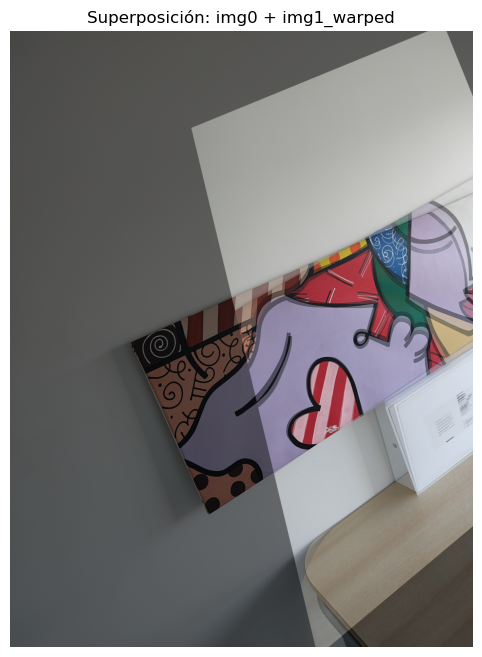

In [14]:
def aplicar_homografia(H, puntos):
    puntos = np.array(puntos)
    puntos_homog = np.hstack([puntos, np.ones((puntos.shape[0], 1))])  
    transformados = (H @ puntos_homog.T).T
    transformados /= transformados[:, 2][:, np.newaxis] 
    return transformados[:, :2]  

proj_pts = aplicar_homografia(homo, pts_img1)

img1_warped = cv2.warpPerspective(img1, homo, (img0.shape[1], img0.shape[0]))

overlay = cv2.addWeighted(img0, 0.5, img1_warped, 0.5, 0)

plt.figure(figsize=(12, 8))
plt.title("Superposición: img0 + img1_warped")
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

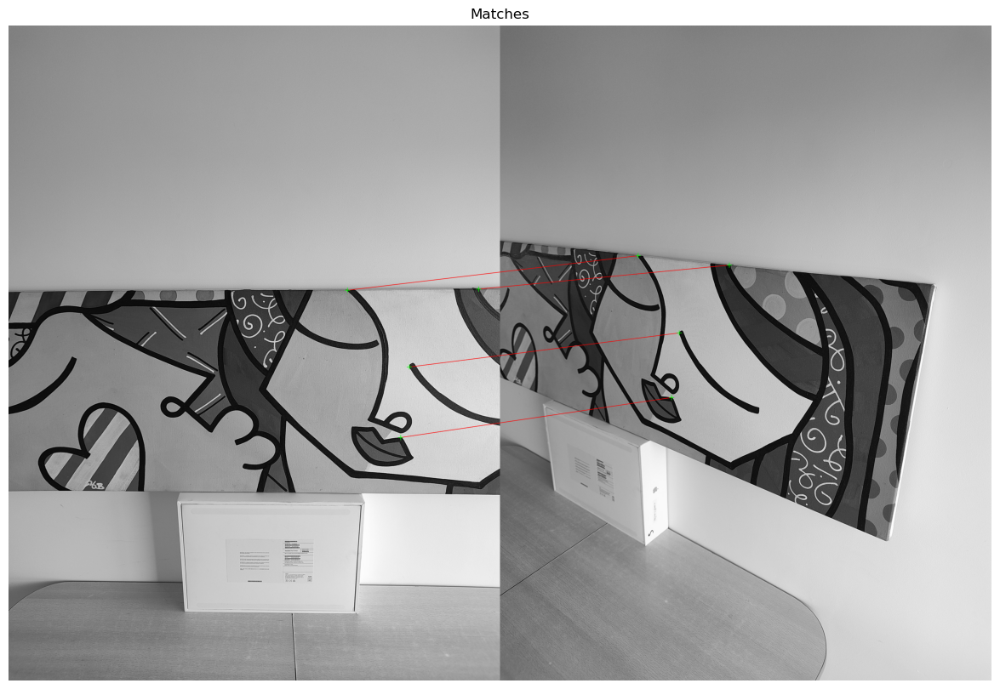

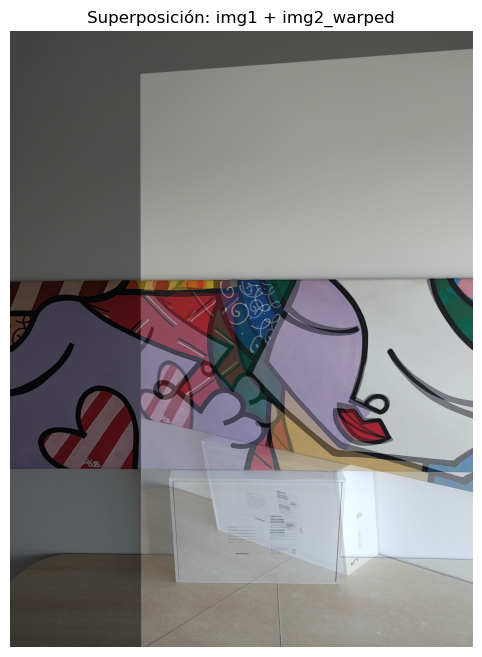

In [ ]:
def distancia(p1, p2):
    return math.hypot(p1[0] - p2[0], p1[1] - p2[1])

def filtrar_por_distancia_minima(puntos1, puntos2, min_dist=200): #para que no tome puntos a pocos píxeles de distancia
    seleccionados = []
    usados = set()

    for i in range(len(puntos1)):
        if i in usados:
            continue
        p1_img1 = puntos1[i]
        p1_img2 = puntos2[i]
        valido = True
        for j in seleccionados:
            if distancia(p1_img1, puntos1[j]) < min_dist or distancia(p1_img2, puntos2[j]) < min_dist:
                valido = False
                break
        if valido:
            seleccionados.append(i)
        if len(seleccionados) == 4:
            break

    return seleccionados

def get_good_matches(matches, ratio_thresh):
    good = []
    for m_n in matches:
        if len(m_n) < 2:
            continue
        m, n = m_n
        if m.distance < ratio_thresh * n.distance:
            good.append(m)
    return good

orb = cv2.ORB_create(nfeatures=9000)

kp_obj, des_obj = orb.detectAndCompute(img1, None)
kp_scn, des_scn = orb.detectAndCompute(img2, None)

FLANN_INDEX_LSH = 6
index_params = dict(algorithm=FLANN_INDEX_LSH,
                    table_number=6,
                    key_size=12,
                    multi_probe_level=1)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des_obj, des_scn, k=2)

good_matches = get_good_matches(matches, 0.75)

if len(good_matches) < 4:
    good_matches = get_good_matches(matches, 0.9)

if len(good_matches) < 4:
    print("Insuficientes matches válidos")
else:
    #top_matches = sorted(good_matches, key=lambda x: x.distance)[:20]
    top_matches_all = sorted(good_matches, key=lambda x: x.distance)[:20] #elegimos a mano asi no se rompe el sistema
    
    indices_deseados = [0, 2, 5, 7]

    top_matches = [top_matches_all[i] for i in indices_deseados]

    pts_img1 = [kp_obj[m.queryIdx].pt for m in top_matches]
    pts_img2 = [kp_scn[m.trainIdx].pt for m in top_matches]

    gray0 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray1 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    h1, w1 = gray0.shape
    h2, w2 = gray1.shape
    height = max(h1, h2)
    vis = np.zeros((height, w1 + w2, 3), dtype=np.uint8)
    vis[:h1, :w1, :] = cv2.cvtColor(gray0, cv2.COLOR_GRAY2BGR)
    vis[:h2, w1:w1 + w2, :] = cv2.cvtColor(gray1, cv2.COLOR_GRAY2BGR)


    for i, m in enumerate(top_matches):
        pt1 = tuple(np.round(kp_obj[m.queryIdx].pt).astype(int))
        pt2 = tuple(np.round(kp_scn[m.trainIdx].pt).astype(int))
        pt2_shifted = (pt2[0] + w1, pt2[1])

        cv2.line(vis, pt1, pt2_shifted, (0, 0, 255), 2, cv2.LINE_AA)

        cross_size = 15
        color = (0, 255, 0)
        thickness = 2
        for pt in [pt1, pt2_shifted]:
            cv2.line(vis, (pt[0] - cross_size, pt[1]), (pt[0] + cross_size, pt[1]), color, thickness, cv2.LINE_AA)
            cv2.line(vis, (pt[0], pt[1] - cross_size), (pt[0], pt[1] + cross_size), color, thickness, cv2.LINE_AA)

    plt.figure(figsize=(15, 10))
    plt.title("Matches")
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


homo=dlt(pts_img2, pts_img1).round(6)

def aplicar_homografia(H, puntos):
    puntos = np.array(puntos)
    puntos_homog = np.hstack([puntos, np.ones((puntos.shape[0], 1))])  
    transformados = (H @ puntos_homog.T).T
    transformados /= transformados[:, 2][:, np.newaxis] 
    return transformados[:, :2]  

proj_pts = aplicar_homografia(homo, pts_img2)

img2_warped = cv2.warpPerspective(img2, homo, (img1.shape[1], img1.shape[0]))

overlay = cv2.addWeighted(img1, 0.5, img2_warped, 0.5, 0)

plt.figure(figsize=(12, 8))
plt.title("Superposición: img1 + img2_warped")
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

---
## 3.5) RANSAC 

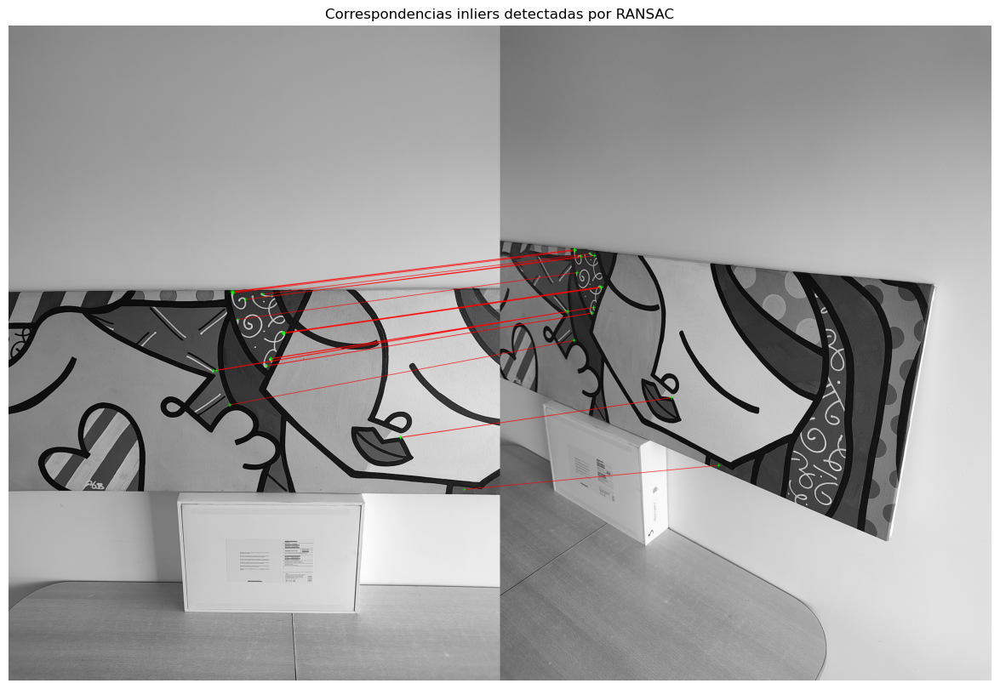

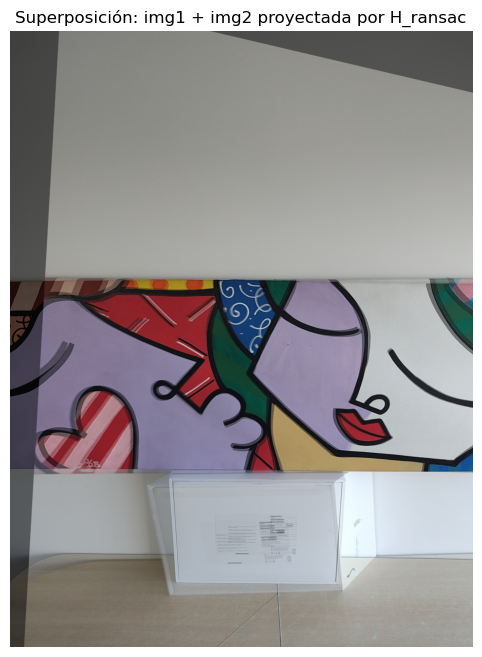

In [16]:

def distancia(p1, p2):
    return math.hypot(p1[0] - p2[0], p1[1] - p2[1])

def aplicar_homografia(H, puntos):
    puntos = np.array(puntos)
    puntos_homog = np.hstack([puntos, np.ones((puntos.shape[0], 1))])
    transformados = (H @ puntos_homog.T).T
    transformados /= transformados[:, 2][:, np.newaxis]
    return transformados[:, :2]

def dlt(ori, dst):
    A = []
    b = []
    for i in range(4):
        x, y = ori[i]
        x_p, y_p = dst[i]
        A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p])
        A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p])
        b.append(x_p)
        b.append(y_p)
    A = np.array(A)
    b = np.array(b)
    H = -np.linalg.solve(A, b)
    H = np.append(H, 1).reshape(3, 3)
    return H

def ransac_homography(pts1, pts2, T=1000, t=5):
    max_inliers = []
    best_H = None

    for _ in range(T):
        idx = random.sample(range(len(pts1)), 4)
        sample_pts1 = [pts1[i] for i in idx]
        sample_pts2 = [pts2[i] for i in idx]
        try:
            H = dlt(sample_pts1, sample_pts2)
        except np.linalg.LinAlgError:
            continue

        pts1_proj = aplicar_homografia(H, pts1)
        error = np.linalg.norm(np.array(pts2) - pts1_proj, axis=1)
        inliers_idx = np.where(error < t)[0]

        if len(inliers_idx) > len(max_inliers):
            max_inliers = inliers_idx
            best_H = H

    if best_H is not None and len(max_inliers) >= 4:
        final_pts1 = [pts1[i] for i in max_inliers]
        final_pts2 = [pts2[i] for i in max_inliers]
        return best_H, final_pts1, final_pts2
    else:
        return None, [], []

def get_good_matches(matches, ratio_thresh):
    good = []
    for m_n in matches:
        if len(m_n) < 2:
            continue
        m, n = m_n
        if m.distance < ratio_thresh * n.distance:
            good.append(m)
    return good

orb = cv2.ORB_create(nfeatures=9000)

kp1, des1 = orb.detectAndCompute(img1, None)  
kp2, des2 = orb.detectAndCompute(img2, None) 

FLANN_INDEX_LSH = 6
index_params = dict(algorithm=FLANN_INDEX_LSH,
                    table_number=6,
                    key_size=12,
                    multi_probe_level=1)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1, des2, k=2)

good_matches = get_good_matches(matches, 0.75)

if len(good_matches) < 4:
    good_matches = get_good_matches(matches, 0.9)

else:
    pts_img1_full = [kp1[m.queryIdx].pt for m in good_matches]
    pts_img2_full = [kp2[m.trainIdx].pt for m in good_matches]

    H_ransac, inlier_pts1, inlier_pts2 = ransac_homography(pts_img1_full, pts_img2_full, T=1000, t=5)

    
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    h1, w1 = gray1.shape
    h2, w2 = gray2.shape
    height = max(h1, h2)
    vis = np.zeros((height, w1 + w2, 3), dtype=np.uint8)
    vis[:h1, :w1] = cv2.cvtColor(gray1, cv2.COLOR_GRAY2BGR)
    vis[:h2, w1:w1 + w2] = cv2.cvtColor(gray2, cv2.COLOR_GRAY2BGR)

    for pt1, pt2 in zip(inlier_pts1, inlier_pts2):
        p1 = tuple(np.round(pt1).astype(int))
        p2 = tuple(np.round(pt2).astype(int))
        p2_shifted = (int(p2[0] + w1), int(p2[1]))

        cv2.line(vis, p1, p2_shifted, (0, 0, 255), 2, cv2.LINE_AA)

        cross_size = 10
        color = (0, 255, 0)
        thickness = 2
        for pt in [p1, p2_shifted]:
            cv2.line(vis, (pt[0] - cross_size, pt[1]), (pt[0] + cross_size, pt[1]), color, thickness, cv2.LINE_AA)
            cv2.line(vis, (pt[0], pt[1] - cross_size), (pt[0], pt[1] + cross_size), color, thickness, cv2.LINE_AA)

    plt.figure(figsize=(15, 10))
    plt.title("Correspondencias inliers detectadas por RANSAC")
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    H_inv = np.linalg.inv(H_ransac)
    img2_warped = cv2.warpPerspective(img2, H_inv, (img1.shape[1], img1.shape[0]))
    overlay = cv2.addWeighted(img1, 0.5, img2_warped, 0.5, 0)
    plt.figure(figsize=(12, 8))
    plt.title("Superposición: img1 + img2 proyectada por H_ransac")
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


Refactoreado para tener una función y utilizar para los 2 casos

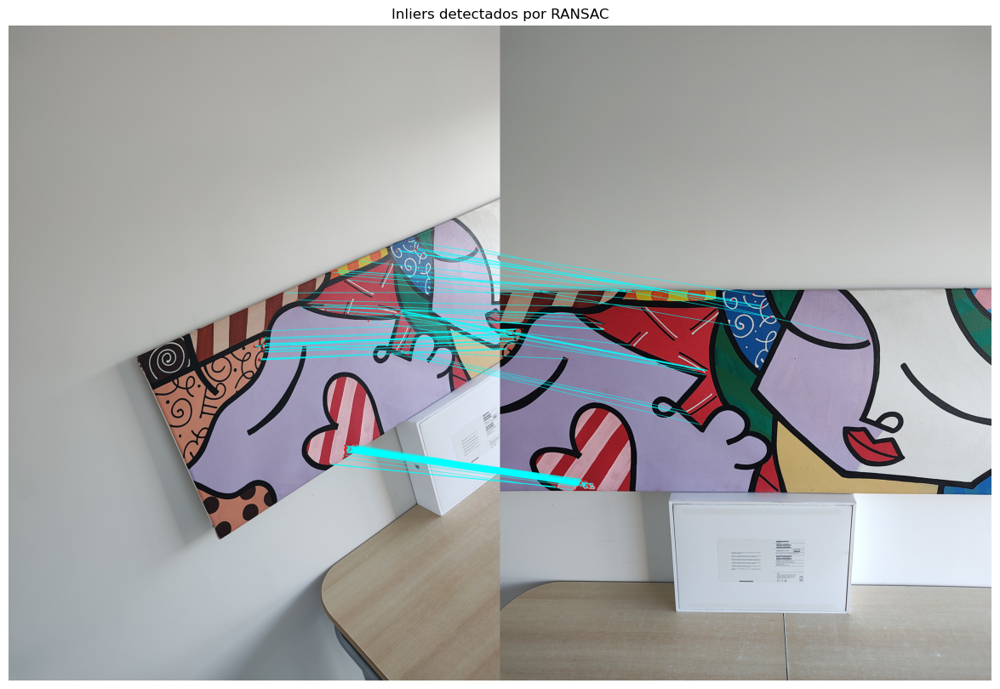

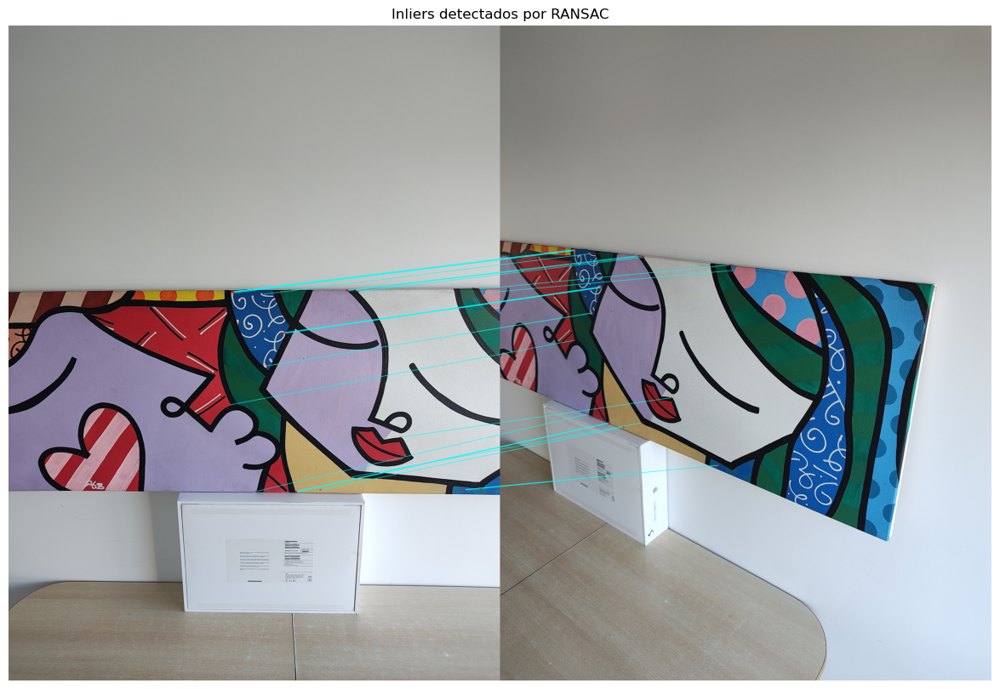

In [17]:
def calcular_homografia_con_ransac(img_a, img_b, draw_matches=True, ratio_thresh=0.75, T=1000, t=5):
    orb = cv2.ORB_create(nfeatures=9000)
    kp_a, des_a = orb.detectAndCompute(img_a, None)
    kp_b, des_b = orb.detectAndCompute(img_b, None)

    FLANN_INDEX_LSH = 6
    index_params = dict(algorithm=FLANN_INDEX_LSH,
                        table_number=6,
                        key_size=12,
                        multi_probe_level=1)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des_a, des_b, k=2)
    good_matches = get_good_matches(matches, ratio_thresh)

    if len(good_matches) < 4:
        good_matches = get_good_matches(matches, 0.9)

    pts_a = [kp_a[m.queryIdx].pt for m in good_matches]
    pts_b = [kp_b[m.trainIdx].pt for m in good_matches]

    H_ab, inlier_pts_a, inlier_pts_b = ransac_homography(pts_a, pts_b, T=T, t=t)
    H_ba = np.linalg.inv(H_ab)

    if draw_matches:
        h1, w1 = img_a.shape[:2]
        h2, w2 = img_b.shape[:2]
        vis = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
        vis[:h1, :w1] = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)
        vis[:h2, w1:w1 + w2] = cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB)

        for pt1, pt2 in zip(inlier_pts_a, inlier_pts_b):
            p1 = tuple(np.round(pt1).astype(int))
            p2 = tuple(np.round(pt2).astype(int))
            p2_shifted = (int(p2[0] + w1), int(p2[1]))
            cv2.line(vis, p1, p2_shifted, (0, 255, 255), 2)
            for pt in [p1, p2_shifted]:
                cv2.drawMarker(vis, pt, (255, 0, 0), cv2.MARKER_CROSS, 10, 2)

        plt.figure(figsize=(15, 10))
        plt.title("Inliers detectados por RANSAC")
        plt.imshow(vis)
        plt.axis('off')
        plt.show()

    return H_ab, H_ba, inlier_pts_a, inlier_pts_b, kp_a, kp_b, good_matches


H_01, H_10, _, _, _, _, _ = calcular_homografia_con_ransac(img0, img1)
H_12, H_21, _, _, _, _, _ = calcular_homografia_con_ransac(img1, img2)


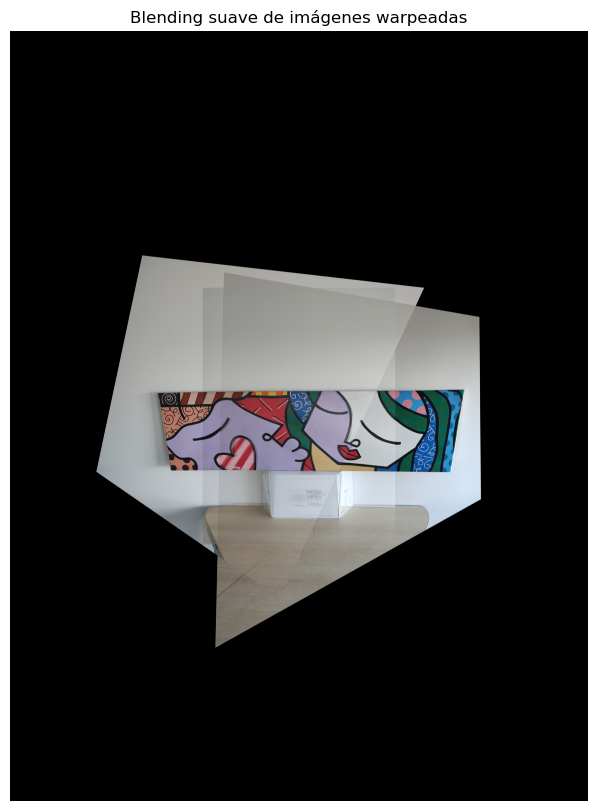

In [18]:
aux = np.array([
    [1, 0, img1.shape[1]],
    [0, 1, img1.shape[0]],
    [0, 0, 1]
], dtype=np.float32)

H0_to_canvas = aux @ H_01
H1_to_canvas = aux
H2_to_canvas = aux @ H_21

canvas_size = (img1.shape[1]*3, img1.shape[0]*3)

warp0 = cv2.warpPerspective(img0, H0_to_canvas, canvas_size)
warp1 = cv2.warpPerspective(img1, H1_to_canvas, canvas_size)
warp2 = cv2.warpPerspective(img2, H2_to_canvas, canvas_size)

mask0 = (warp0 > 0).astype(np.uint8)
mask1 = (warp1 > 0).astype(np.uint8)
mask2 = (warp2 > 0).astype(np.uint8)

acumulador = warp0.astype(np.float32) * mask0 + \
             warp1.astype(np.float32) * mask1 + \
             warp2.astype(np.float32) * mask2

conteo = mask0 + mask1 + mask2
conteo[conteo == 0] = 1

blended = (acumulador / conteo).astype(np.uint8)

plt.figure(figsize=(16, 10))
plt.title("Blending suave de imágenes warpeadas")
plt.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


---
## Ahora probamos con otras imágenes de la misma escena

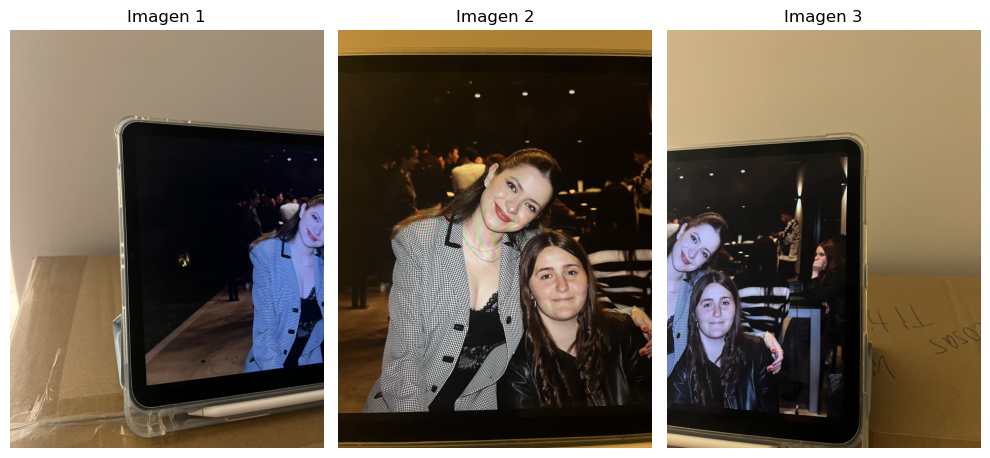

In [19]:
imagen0 = cv2.imread("img/nosotras0.jpg")
imagen1 = cv2.imread("img/nosotras1.jpg")
imagen2 = cv2.imread("img/nosotras2.jpg")

fig, axs = plt.subplots(1, 3, figsize=(10, 5))

axs[0].imshow(cv2.cvtColor(imagen0, cv2.COLOR_BGR2RGB))
axs[0].set_title('Imagen 1')
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(imagen1, cv2.COLOR_BGR2RGB))
axs[1].set_title('Imagen 2')
axs[1].axis('off')
axs[2].imshow(cv2.cvtColor(imagen2, cv2.COLOR_BGR2RGB))
axs[2].set_title('Imagen 3')
axs[2].axis('off')

plt.tight_layout()
plt.show()

/var/folders/g_/tyh8tmf93nv9b1rfr214tqkw0000gn/T/ipykernel_8080/3007925241.py:8: RuntimeWarning: divide by zero encountered in divide
  transformados /= transformados[:, 2][:, np.newaxis]
/var/folders/g_/tyh8tmf93nv9b1rfr214tqkw0000gn/T/ipykernel_8080/3007925241.py:8: RuntimeWarning: invalid value encountered in divide
  transformados /= transformados[:, 2][:, np.newaxis]


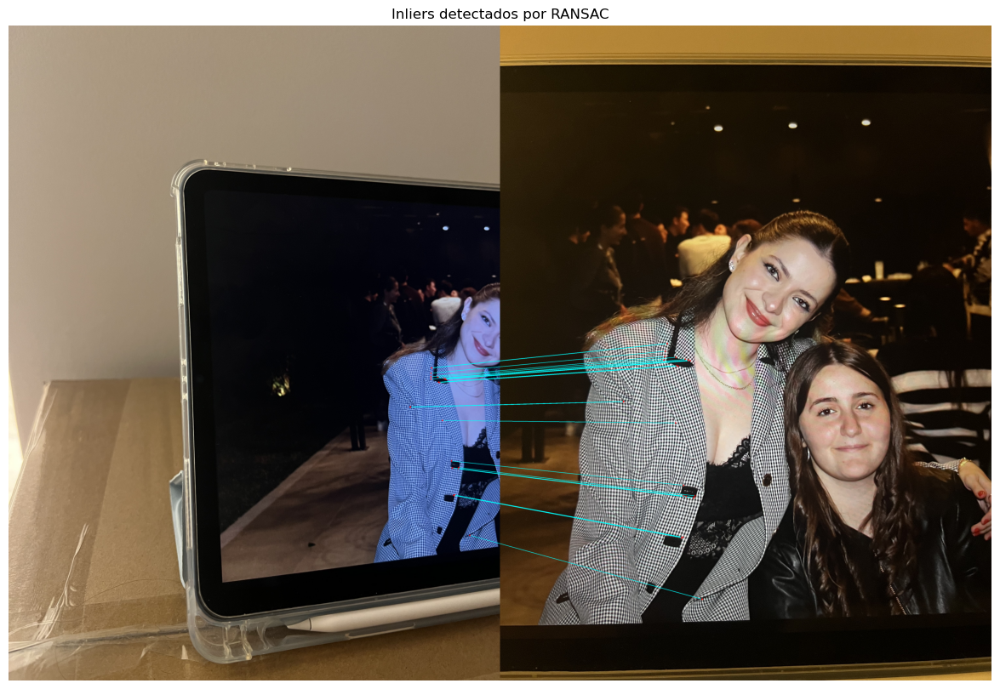

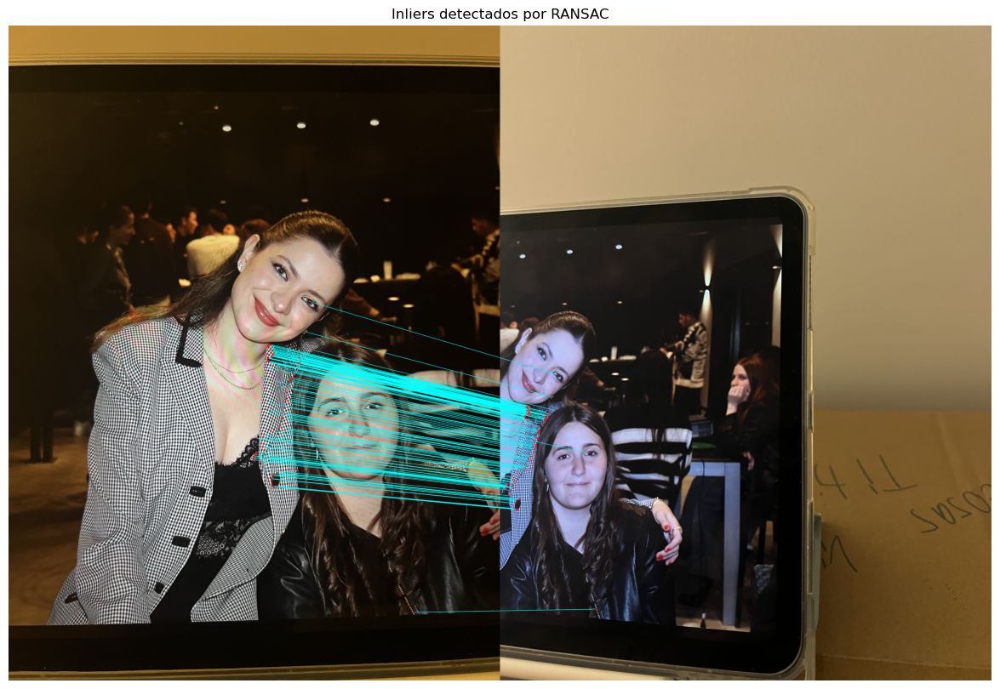

In [20]:
def calcular_homografia_con_ransac(img_a, img_b, draw_matches=True, ratio_thresh=0.75, T=1000, t=5):
    orb = cv2.ORB_create(nfeatures=9000)
    kp_a, des_a = orb.detectAndCompute(img_a, None)
    kp_b, des_b = orb.detectAndCompute(img_b, None)

    FLANN_INDEX_LSH = 6
    index_params = dict(algorithm=FLANN_INDEX_LSH,
                        table_number=6,
                        key_size=12,
                        multi_probe_level=1)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des_a, des_b, k=2)
    good_matches = get_good_matches(matches, ratio_thresh)

    if len(good_matches) < 4:
        good_matches = get_good_matches(matches, 0.9)

    pts_a = [kp_a[m.queryIdx].pt for m in good_matches]
    pts_b = [kp_b[m.trainIdx].pt for m in good_matches]

    H_ab, inlier_pts_a, inlier_pts_b = ransac_homography(pts_a, pts_b, T=T, t=t)
    H_ba = np.linalg.inv(H_ab)

    if draw_matches:
        h1, w1 = img_a.shape[:2]
        h2, w2 = img_b.shape[:2]
        vis = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
        vis[:h1, :w1] = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)
        vis[:h2, w1:w1 + w2] = cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB)

        for pt1, pt2 in zip(inlier_pts_a, inlier_pts_b):
            p1 = tuple(np.round(pt1).astype(int))
            p2 = tuple(np.round(pt2).astype(int))
            p2_shifted = (int(p2[0] + w1), int(p2[1]))
            cv2.line(vis, p1, p2_shifted, (0, 255, 255), 2)
            for pt in [p1, p2_shifted]:
                cv2.drawMarker(vis, pt, (255, 0, 0), cv2.MARKER_CROSS, 10, 2)

        plt.figure(figsize=(15, 10))
        plt.title("Inliers detectados por RANSAC")
        plt.imshow(vis)
        plt.axis('off')
        plt.show()

    return H_ab, H_ba, inlier_pts_a, inlier_pts_b, kp_a, kp_b, good_matches


H_01, H_10, _, _, _, _, _ = calcular_homografia_con_ransac(imagen0, imagen1)
H_12, H_21, _, _, _, _, _ = calcular_homografia_con_ransac(imagen1, imagen2)


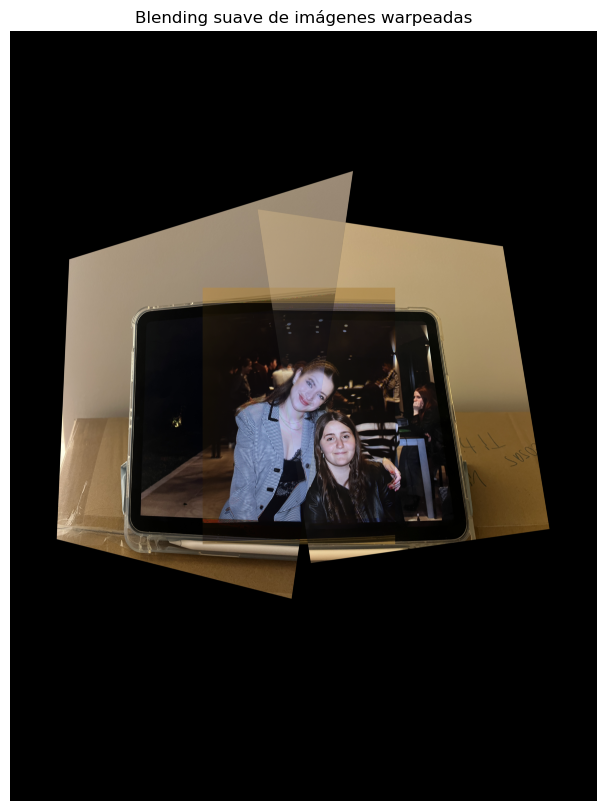

In [21]:

aux = np.array([
    [1, 0, imagen1.shape[1]],
    [0, 1, imagen1.shape[0]],
    [0, 0, 1]
], dtype=np.float32)

H0_to_canvas = aux @ H_01
H1_to_canvas = aux
H2_to_canvas = aux @ H_21

canvas_size = (img1.shape[1]*3, imagen1.shape[0]*3)

warp0 = cv2.warpPerspective(imagen0, H0_to_canvas, canvas_size)
warp1 = cv2.warpPerspective(imagen1, H1_to_canvas, canvas_size)
warp2 = cv2.warpPerspective(imagen2, H2_to_canvas, canvas_size)

mask0 = (warp0 > 0).astype(np.uint8)
mask1 = (warp1 > 0).astype(np.uint8)
mask2 = (warp2 > 0).astype(np.uint8)

acumulador = warp0.astype(np.float32) * mask0 + \
             warp1.astype(np.float32) * mask1 + \
             warp2.astype(np.float32) * mask2

conteo = mask0 + mask1 + mask2
conteo[conteo == 0] = 1

blended = (acumulador / conteo).astype(np.uint8)

plt.figure(figsize=(16, 10))
plt.title("Blending suave de imágenes warpeadas")
plt.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()